<a href="https://colab.research.google.com/github/LionelSh/Jedha-Wallmart-Conversion-Uber-B3/blob/main/Uber_pickups_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Before starting:
Kindly intall dash by executing the cell below:


In [1]:
# for the reviewer ir examiner if necessary:
!pip install dash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 73.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 22.8 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 2.3.6
    Uninstalling Werkzeug-2.3.6:
      Successfully uninstalled Werkzeug-2.3.6


# 1) Imports

## 1.a) Import Libraries

In [2]:
import pandas as pd
from datetime import date
from tqdm._tqdm_notebook import tqdm_notebook   # didn't use it
import os


#=== Preprocessing
from sklearn.preprocessing import StandardScaler

#=== ML learning
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score



#=== Visualizations
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go


from dash import Dash, html, dash_table, dcc,callback, Output, Input, ctx
# dcc stands for Dash Core Components
# callback, Output and Input are for the interactivity of the graph


<ipython-input-2-4cbca95d9f7b>:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  from tqdm._tqdm_notebook import tqdm_notebook   # didn't use it


## 1.b) Import files

Option(1) Import from google drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# IF you wish to import from the google drive execute this cell otherwise the one after
dataset = pd.read_csv("/content/drive/MyDrive/FullStack_projects/Uber/uber-raw-data-apr14.csv")


Option(2) Import from local

In [5]:
#dataset = pd.read_csv("uber-trip-data\\uber-raw-data-apr14.csv")

# dataset = pd.read_csv("uber-trip-data\\uber-raw-data-janjune-15.csv")
#=== This 'janjune' dataset contains locationID instead of coordinates

#dataset = pd.read_csv("uber-trip-data\\uber-raw-data-aug14.csv")


# 2) EDA Exploratory Data Analysis

In [6]:
print('Dataset overview')
display(dataset.head(10))
print()

print('Checking for missing data..')
print(dataset.isna().sum()/dataset.shape[0]*100)
print()

print('Column types')
print(dataset.dtypes)

print()
print(f'Dataset shape : {dataset.shape}')


Dataset overview


,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
5,4/1/2014 0:33:00,40.7383,-74.0403,B02512
6,4/1/2014 0:39:00,40.7223,-73.9887,B02512
7,4/1/2014 0:45:00,40.7620,-73.9790,B02512
8,4/1/2014 0:55:00,40.7524,-73.9960,B02512
9,4/1/2014 1:01:00,40.7575,-73.9846,B02512



Checking for missing data..
Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

Column types
Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

Dataset shape : (564516, 4)


**Obervations**
1. the Date type is string we need to treat it and split it into days, months and years
2. No missing data


In [7]:
#transfer the data from string to a datetime object

def date_operations(dataset):
  dataset['Date_Time'] = pd.to_datetime(dataset['Date/Time'])

  # create two columns one for the date and the second for the time
  dataset['Date'] = dataset['Date_Time'].dt.date
  dataset['Time'] = dataset['Date_Time'].dt.time

  # to ease up the calculations and to avoid the model from saphocating
  # I'll propose to add an hour column which contains all requests occurred during this hour
  dataset['Hour'] = dataset['Date_Time'].dt.hour

  # Finally we will add the name of the day
  dataset['Day'] =dataset['Date_Time'].dt.day_name()
  # and the month
  dataset['Month'] = dataset['Date_Time'].dt.month_name()
  # and the year
  dataset['Year'] = dataset['Date_Time'].dt.year


  dataset.head(8)

  return dataset

# call function
date_operations(dataset)


,Date/Time,Lat,Lon,Base,Date_Time,Date,Time,Hour,Day,Month,Year
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,2014-04-01 00:11:00,2014-04-01,00:11:00,0,Tuesday,April,2014
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,2014-04-01 00:17:00,2014-04-01,00:17:00,0,Tuesday,April,2014
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,2014-04-01 00:21:00,2014-04-01,00:21:00,0,Tuesday,April,2014
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,2014-04-01 00:28:00,2014-04-01,00:28:00,0,Tuesday,April,2014
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,2014-04-01 00:33:00,2014-04-01,00:33:00,0,Tuesday,April,2014
...,...,...,...,...,...,...,...,...,...,...,...
564511,4/30/2014 23:22:00,40.7640,-73.9744,B02764,2014-04-30 23:22:00,2014-04-30,23:22:00,23,Wednesday,April,2014
564512,4/30/2014 23:26:00,40.7629,-73.9672,B02764,2014-04-30 23:26:00,2014-04-30,23:26:00,23,Wednesday,April,2014
564513,4/30/2014 23:31:00,40.7443,-73.9889,B02764,2014-04-30 23:31:00,2014-04-30,23:31:00,23,Wednesday,April,2014
564514,4/30/2014 23:32:00,40.6756,-73.9405,B02764,2014-04-30 23:32:00,2014-04-30,23:32:00,23,Wednesday,April,2014


In [8]:
dataset.dtypes

Date/Time            object
Lat                 float64
Lon                 float64
Base                 object
Date_Time    datetime64[ns]
Date                 object
Time                 object
Hour                  int64
Day                  object
Month                object
Year                  int64
dtype: object

In [9]:
# checking what base stand for
dataset['Base'].unique()

array(['B02512', 'B02598', 'B02617', 'B02682', 'B02764'], dtype=object)

In [10]:
# Extract the features that we need
dataset.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base', 'Date_Time', 'Date', 'Time', 'Hour',
       'Day', 'Month', 'Year'],
      dtype='object')

In [11]:
df = dataset.drop(['Date/Time', 'Base','Time'], axis = 1)

In [12]:
df.head(8)

,Lat,Lon,Date_Time,Date,Hour,Day,Month,Year
0,40.7690,-73.9549,2014-04-01 00:11:00,2014-04-01,0,Tuesday,April,2014
1,40.7267,-74.0345,2014-04-01 00:17:00,2014-04-01,0,Tuesday,April,2014
2,40.7316,-73.9873,2014-04-01 00:21:00,2014-04-01,0,Tuesday,April,2014
3,40.7588,-73.9776,2014-04-01 00:28:00,2014-04-01,0,Tuesday,April,2014
4,40.7594,-73.9722,2014-04-01 00:33:00,2014-04-01,0,Tuesday,April,2014
5,40.7383,-74.0403,2014-04-01 00:33:00,2014-04-01,0,Tuesday,April,2014
6,40.7223,-73.9887,2014-04-01 00:39:00,2014-04-01,0,Tuesday,April,2014
7,40.7620,-73.9790,2014-04-01 00:45:00,2014-04-01,0,Tuesday,April,2014


In [13]:
df.dtypes

Lat                 float64
Lon                 float64
Date_Time    datetime64[ns]
Date                 object
Hour                  int64
Day                  object
Month                object
Year                  int64
dtype: object

In [14]:
df['Date'] = pd.to_datetime(df['Date'])


In [15]:
df.dtypes

Lat                 float64
Lon                 float64
Date_Time    datetime64[ns]
Date         datetime64[ns]
Hour                  int64
Day                  object
Month                object
Year                  int64
dtype: object

# 3) Create Visualization

## 3.a) Traffic behaviour during day

In [16]:
# illustrate the traffic distribution during the day

def trend_hourly(df_lab, date):

  # filter a day
  mask = df['Date'] == date
  df_lab = df.loc[mask,:].copy()

  print(f'the dimensions of the table after filtering on one day is {df_lab.shape}')
  display(df_lab.head(5))

  # plot the distribution of uber requests through out the day
  fig = px.histogram(df_lab,x='Hour')
  fig.show()

  # Uncomment the following for troubleshooting only
  # df_lab['Hour'].value_counts(ascending=False)


In [17]:
# choose a date according to the file chosen to be exported
trend_hourly(df,'2014-04-07')

the dimensions of the table after filtering on one day is (19550, 8)


,Lat,Lon,Date_Time,Date,Hour,Day,Month,Year
7785,40.7205,-73.9939,2014-04-07 00:31:00,2014-04-07,0,Monday,April,2014
7786,40.7407,-74.0077,2014-04-07 00:37:00,2014-04-07,0,Monday,April,2014
7787,40.7591,-73.9892,2014-04-07 00:50:00,2014-04-07,0,Monday,April,2014
7788,40.7419,-74.0034,2014-04-07 00:58:00,2014-04-07,0,Monday,April,2014
7789,40.7419,-74.0034,2014-04-07 01:27:00,2014-04-07,1,Monday,April,2014


## 3.b) Traffic behaviour during the months

In [18]:
# illustrate the traffic distribution daily during the month

def trend_days(df_lab, month):
  # filter the month
  mask = df['Month'] == month
  df_lab = df_lab.loc[mask,:].copy()

  print(f'the dimensions of the table after filtering on one month is {df_lab.shape}')
  display(df_lab.head(5))

  # plot the distribution of uber requests through out the day
  fig = px.histogram(df_lab,x='Date',color='Day')
  fig.show()

  # Uncomment the following for troubleshooting only
  # df_lab['Hour'].value_counts(ascending=False)

In [19]:
trend_days(df,'April')

the dimensions of the table after filtering on one month is (564516, 8)


,Lat,Lon,Date_Time,Date,Hour,Day,Month,Year
0,40.7690,-73.9549,2014-04-01 00:11:00,2014-04-01,0,Tuesday,April,2014
1,40.7267,-74.0345,2014-04-01 00:17:00,2014-04-01,0,Tuesday,April,2014
2,40.7316,-73.9873,2014-04-01 00:21:00,2014-04-01,0,Tuesday,April,2014
3,40.7588,-73.9776,2014-04-01 00:28:00,2014-04-01,0,Tuesday,April,2014
4,40.7594,-73.9722,2014-04-01 00:33:00,2014-04-01,0,Tuesday,April,2014


in April there seem to be a wednesday the 30th where there was an event maybe that resulted in too many transport requests, on our study we shall take a regular day to obtain a regular behaviour not an exceptional one

## 3.6) Create interactive map

To enable efficient observation we'll install plotly dash

In [20]:
# for the options menu in the map
hours = df['Hour'].unique()
dates = df['Date'].dt.strftime('%Y-%m-%d').unique()

In [21]:
print(hours)
print(dates)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
['2014-04-01' '2014-04-02' '2014-04-03' '2014-04-04' '2014-04-05'
 '2014-04-06' '2014-04-07' '2014-04-08' '2014-04-09' '2014-04-10'
 '2014-04-11' '2014-04-12' '2014-04-13' '2014-04-14' '2014-04-15'
 '2014-04-16' '2014-04-17' '2014-04-18' '2014-04-19' '2014-04-20'
 '2014-04-21' '2014-04-22' '2014-04-23' '2014-04-24' '2014-04-25'
 '2014-04-26' '2014-04-27' '2014-04-28' '2014-04-29' '2014-04-30']


In [22]:
type(dates)

numpy.ndarray

In [23]:
df['Date']

0        2014-04-01
1        2014-04-01
2        2014-04-01
3        2014-04-01
4        2014-04-01
            ...    
564511   2014-04-30
564512   2014-04-30
564513   2014-04-30
564514   2014-04-30
564515   2014-04-30
Name: Date, Length: 564516, dtype: datetime64[ns]

In [24]:


chosen_hour = 17
chosen_date = '2014-04-01'

app = Dash(__name__)

# This is the layout of our mini-page
app.layout = html.Div([
    #Add a title
    html.Div(children='Traffic Distribution'),

    #Add a line
    html.Hr(),

    # Add a date-picker
    html.Div(children='Choose a Date'),
     dcc.DatePickerSingle(
         id='date-picker',               # the element id
         min_date_allowed=dates.min(),   # min date available
         max_date_allowed=dates.max(),   # max date available
         initial_visible_month=dates.min(),  # initial value
         date=dates.min()                    # the current value
     ),

    # Add a field to show the chosen date
    html.Div(id='chosen-date'),

    # Radio items to choose the hour
    html.Div(children='Choose an hour to view the distribution'),
    html.Div(children=[
            dcc.RadioItems(options=hours, value='17', id='controls-hour', inline=True),
        ]),

    # The Map
    html.Div(children=[
            dcc.Graph(figure= {} , id='map')  # the id of the map and the figure
        ])
])


# Add controls to build the interaction
@callback(
    Output(component_id='map', component_property='figure'),
    Input(component_id='controls-hour', component_property='value'),
    Input(component_id='date-picker', component_property='date'),

)

def update_graph(hour_chosen, date_chosen):
    global chosen_date
    global chosen_hour

    if ctx.triggered_id == 'controls-hour':
        chosen_hour = int(hour_chosen)
        mask_hour_day = (df['Hour'] == chosen_hour) & (df['Date'] == chosen_date)
        temp = df.loc[mask_hour_day,:]
        fig = px.scatter_mapbox(temp, lat="Lat", lon="Lon", zoom=10, mapbox_style="carto-positron")
        return fig
    else:
        chosen_date = date_chosen
        mask_hour_day = (df['Hour'] == chosen_hour) & (df['Date'] == chosen_date)
        temp = df.loc[mask_hour_day,:]
        fig = px.scatter_mapbox(temp, lat="Lat", lon="Lon", zoom=10, mapbox_style="carto-positron")
        return fig


if __name__ == '__main__':
    app.run(debug=True)

#dash_table.DataTable(data=df.to_dict('records'), page_size=10),


<IPython.core.display.Javascript object>

# 4) Data preprocessing & normalizing

**Should we normalize?**

Of course, it is strongly recommended that we implement normaization due to the fact that the longtitude and the latitude have different scalings.

In addition to prevent having a feature that is dominant in clustering and might deviate the results.

It is always recommended to normalize unless there was only one feature or in other very rare cases.

We will implement the normalizing per case when we filter a day and time

**Should we normalize the whole dataset for the whole 5 months alltogether? or only per case 'day & hour'?**

There are two points of view, the first is yes normalize the whole dataset, usually this is the way things are done, to take all the scale into account for the whole dataset especially if you need to compare different results together for the whole dataset.

The second point of view is that there is no problem, we can simply normaize each case alone becasue the target is to make clustering for each situation and not prediction for new values. since each case will generat its scale, what is important is to normalizein

### Normalizing according to our specific day and hour

In [25]:
def normalize(df):

  # 1) define the features on which the clustering will be based
  features = ['Lat','Lon']

  # 2) filter the features as inputs for machine learning
  x = df.loc[:,features]

  # 3) Normalize & fit
  sc = StandardScaler()     # using the standard scaler to normalize
  x_scaled = sc.fit_transform(x)  # fitting the data

  # view a sclice of the normaized data
  print('Normaized data sample:')
  print(x_scaled[:10])

  print(f'normaized data shape: {x_scaled.shape}')

  return x_scaled

# 5) Clustering

We will first start to test a specific day and a aspecific hour then we will generalize

### Choose Date and Time

In [26]:
# Let's start with a small slice of data

# Choose a specifc date and a specific hour
date = '2014-04-07'
hour = 0

# Filter this day and hour
mask = (df['Date'] == date) & (df['Hour'] == hour)
X = df.loc[mask,:].copy()

# normalize before clustering
x_scaled = normalize(X)

Normaized data sample:
[[-0.13845763 -0.35412709]
 [ 0.30273956 -0.54738467]
 [ 0.70462214 -0.28830748]
 [ 0.32894929 -0.48716673]
 [ 0.7220953  -0.06003946]
 [-1.7132258   2.60355422]
 [ 0.06029952 -0.45355672]
 [ 0.65657096  0.00998141]
 [ 0.1083507  -0.24209371]
 [ 0.91430001  0.15002313]]
normaized data shape: (102, 2)


## 5.a) k-means clustering technique

### Inertia metric

In [27]:
## K-Means
# delare a list of the Within Clustering Sum of Squares
wcss=[]
print('Inertia values per numer of clusters (k):')
slope_list =[]

for i in range(2,16):
    # implementing the kMeans clustering function on the data
    kmeans = KMeans(n_clusters=i ,n_init='auto', random_state=0) # n_init value is auto as scikit recommendation , the old value is depricated

    kmeans.fit(x_scaled)

    print (f"for k = {i}, inertia = {kmeans.inertia_}")
    wcss.append(kmeans.inertia_)

print(len(wcss))
for i in range(len(wcss)-1):

  slope = wcss[i] - wcss[i+1]
  print(f'k ={i+1} {slope}')
  slope_list.append(slope)




Inertia values per numer of clusters (k):
for k = 2, inertia = 103.1898085063428
for k = 3, inertia = 75.03352213650115
for k = 4, inertia = 47.09662182293741
for k = 5, inertia = 33.53600843844654
for k = 6, inertia = 21.78013372334986
for k = 7, inertia = 14.805743970257485
for k = 8, inertia = 11.443057399846328
for k = 9, inertia = 9.688747816756436
for k = 10, inertia = 8.545067423027671
for k = 11, inertia = 7.107885772294681
for k = 12, inertia = 6.484990830883447
for k = 13, inertia = 5.483481967373653
for k = 14, inertia = 4.6958602446326365
for k = 15, inertia = 4.560389766935415
14
k =1 28.156286369841652
k =2 27.93690031356374
k =3 13.560613384490871
k =4 11.755874715096677
k =5 6.974389753092375
k =6 3.3626865704111566
k =7 1.754309583089892
k =8 1.143680393728765
k =9 1.43718165073299
k =10 0.6228949414112339
k =11 1.0015088635097946
k =12 0.787621722741016
k =13 0.1354704776972211


In [28]:
slope_list

[28.156286369841652,
 27.93690031356374,
 13.560613384490871,
 11.755874715096677,
 6.974389753092375,
 3.3626865704111566,
 1.754309583089892,
 1.143680393728765,
 1.43718165073299,
 0.6228949414112339,
 1.0015088635097946,
 0.787621722741016,
 0.1354704776972211]

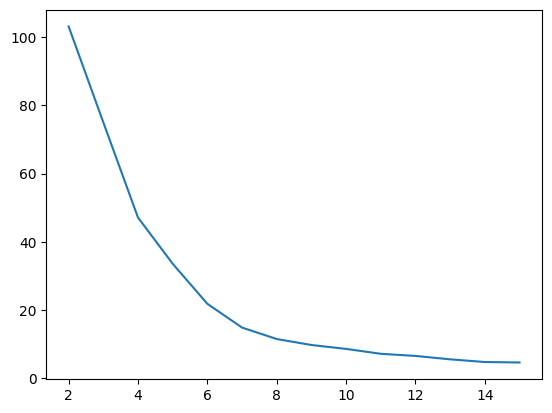

In [29]:
k_values = range(2,16)
plt.plot(k_values,wcss)
plt.show()

### Silhouette metric

In [30]:
sil = []
k = []

for i in range (2,25):
    kmeans = KMeans(n_clusters= i,n_init='auto', random_state = 0)
    kmeans.fit(x_scaled)
    sil.append(silhouette_score(x_scaled, kmeans.predict(x_scaled)))
    k.append(i)
    print("Silhouette score for K={} is {}".format(i, sil[-1]))

Silhouette score for K=2 is 0.6332389754417569
Silhouette score for K=3 is 0.42092682214014643
Silhouette score for K=4 is 0.47435520624501865
Silhouette score for K=5 is 0.48594868362432764
Silhouette score for K=6 is 0.4685017753299604
Silhouette score for K=7 is 0.5135563965508246
Silhouette score for K=8 is 0.5216552027049945
Silhouette score for K=9 is 0.475666416934843
Silhouette score for K=10 is 0.49573693977978717
Silhouette score for K=11 is 0.5155021036457871
Silhouette score for K=12 is 0.5020685941552763
Silhouette score for K=13 is 0.5044349991285972
Silhouette score for K=14 is 0.5011184094508558
Silhouette score for K=15 is 0.4713554207380046
Silhouette score for K=16 is 0.47393421312886425
Silhouette score for K=17 is 0.45448629948258507
Silhouette score for K=18 is 0.4485891061420503
Silhouette score for K=19 is 0.4720614577006678
Silhouette score for K=20 is 0.46697551246181646
Silhouette score for K=21 is 0.42917985215321885
Silhouette score for K=22 is 0.4294144198

Viewing Results

In [31]:
# to draw the result on the map we need
# 1. define your kmeans model with the chosen k
kmeans = KMeans(n_clusters= 13, n_init='auto' , random_state=0 )

# 2. train your model
kmeans.fit(x_scaled)

# 3. find the labels of the points by predicting them using the trained model
# But pay attention here we use the original X which contains the real co-ordinates BEFORE normailzation
X.loc[:,'KMeans_labels'] = kmeans.predict(x_scaled)

print(X.head(4))

fig = px.scatter_mapbox(X, lat="Lat", lon="Lon", color = "KMeans_labels",zoom=10, mapbox_style="carto-positron")
fig.show()


          Lat      Lon           Date_Time       Date  Hour     Day  Month  \
7785  40.7205 -73.9939 2014-04-07 00:31:00 2014-04-07     0  Monday  April   
7786  40.7407 -74.0077 2014-04-07 00:37:00 2014-04-07     0  Monday  April   
7787  40.7591 -73.9892 2014-04-07 00:50:00 2014-04-07     0  Monday  April   
7788  40.7419 -74.0034 2014-04-07 00:58:00 2014-04-07     0  Monday  April   

      Year  KMeans_labels  
7785  2014              8  
7786  2014              1  
7787  2014              7  
7788  2014              1  


## 5.b) DBScan

Dear rviewer feel free to change the hyper-parameters in the DBSCAN instruction

In [32]:
# using the scikit DBSCAN

db = DBSCAN(eps=0.15, min_samples=2, metric="euclidean", algorithm="brute")
# brute means that each data points are evaluated one-by-one
# no need to use manahtten metric beacuse all numeric

db.fit(x_scaled)    # clustering using DBSCAN

X['DBSCAN_labels'] = db.labels_  # updating the features with their cluster labels

fig = px.scatter_mapbox(X, lat="Lat", lon="Lon", color = "DBSCAN_labels",zoom=10, mapbox_style="carto-positron")
fig.show()

It could be concluded that when there is a huge high intensity of number of requests in a big area, using DB scan it is really difficult to split this into clusters, in the end of the day the whole area is considered a hot spot 😀 adn satisfies the criteria.
Try above  eps=0.2, min_samples=15.
*****
during the off peak
eps=0.15, min_samples=2, metric="euclidean", algorithm="brute"

date = '2014-08-07'
hour = 0
******


# Conclusions

Silhouete: True...but.... True that the value that is closest to 1 gives the better clustering, becasue silhouette means how far are the points of each cluster far from the other.

Silhouette has done its duty to clusterize the points in an correct manner meaning that infact all the points that are close together are classified in a cluster.

But in our case this has resulted in the whole city to be calssified in a cluster or two.

Our study case requires that the clients don;t wait for too long, consequently this large cluster is not a solution.

We will use the kmeans technique to split more this large huge cluster into smaller ones to satisfy clients.

Consequently, there is no problem , infact it is useful to icreas more the clusters that can maintain the coherence in location and achieve the objective og having smaller hot zones for bith the clients and driversthe problem here is that due due to

# 6) Bulk-Calculator
We shall take the whole hours during the day and clusterize them according to both techniques

## 6.1) Normalizing
This is the normalization function

In [33]:
def normalize(df):

  # 1) define the features on which the clustering will be based
  features = ['Lat','Lon']

  # 2) filter the features as inputs for machine learning
  x = df.loc[:,features]

  # 3) Normalize & fit
  sc = StandardScaler()     # using the standard scaler to normalize
  x_scaled = sc.fit_transform(x)  # fitting the data

  # view a sclice of the normaized data
  print('Normaized data sample:')
  print(x_scaled[:10])

  print(f'normaized data shape: {x_scaled.shape}')

  return x_scaled

# 6.2) Clustering

## a) DB-Scan

In [34]:
## DBScan
# using the scikit DBSCAN
def dbscan_clustering(df_scaled):

  db = DBSCAN(eps=0.15, min_samples=5, metric="euclidean", algorithm="brute")
  # brute means that each data points are evaluated one-by-one
  # no need to use manahtten metric beacuse all numeric

  db.fit(df_scaled)    # clustering using DBSCAN

  df_filtered['DBSCAN_labels'] = db.labels_  # updating the features with their cluster labels
  print('DBScan result:')
  print(df_filtered.head(3))



## b) Kmeans - estimation

In [35]:
## K-Means

def calculate_kmeans(x_scaled):
  # delare a list of the Within Clustering Sum of Squares
  wcss=[]
  print('Inertia values per numer of clusters (k):')

  # implemnt clusterig for the first time
  kmeans = KMeans(n_clusters=2 ,n_init='auto', random_state=0) # n_init value is auto as scikit recommendation , the old value is depricated
  kmeans.fit(x_scaled)
  print (f"for k = 2 , inertia = {kmeans.inertia_}")
  wcss.append(kmeans.inertia_)
  print(f'wcssleength = {len(wcss)}')


  for i in range(3,16):

      # implementing the kMeans clustering function on the data
      kmeans = KMeans(n_clusters=i ,n_init='auto', random_state=0) # n_init value is auto as scikit recommendation , the old value is depricated

      kmeans.fit(x_scaled)

      print (f"for k = {i}, inertia = {kmeans.inertia_}")
      wcss.append(kmeans.inertia_)
      print(wcss)

      # checking condition whether to stop or no
      print(wcss[-1])
      print(wcss[-2])
      if (wcss[-2] - wcss[-1]) < 10:    # this is the slope value chosen
        return i
  return i


## c) kmeans clustering
After determinig the optimum k => implement the clustering

In [36]:
# clustering using kmeans value
# k is the numebr of clusters and x_scaled is the normalized data

def   kmeans_clustering( k, x_scaled):
  print(k)
  kmeans = KMeans(n_clusters=k ,n_init='auto', random_state=0) # n_init value is auto as scikit recommendation , the old value is depricated
  kmeans.fit(x_scaled)

  ## adding the labels to the df_filtered
  df_filtered.loc[:,'KMeans_labels'] = kmeans.predict(x_scaled)
  print(df_filtered.head(3))





# 7) Implementation

In [37]:
# define a final dataset that contains the clustering labels and centeroids

dataset_clusterized = pd.DataFrame(columns = ['Lat', 'Lon',
                                             'Date_Time', 'Date', 'Hour', 'Day', 'Month', 'Year',
                                             'KMeans_labels',
                                             'DBSCAN_labels',
                                             ] )


### Here is where the action starts

In [38]:
 # 1) Establish list of hours and dates from the dataset
chosen_date = '2014-04-07'

list_of_hours = df['Hour'].unique()


#  2) Loop through each hour of the day and clusterize

for hour in list_of_hours:

  # mask the dataset
  print(f'filtering {chosen_date} at {hour}')
  print(type(hour))
  mask = (df['Date'] == chosen_date) & (df['Hour'] == int(hour))
  df_filtered = df.loc[mask,:].copy()
  print('a smaple of filtered:')
  print(df_filtered.head(3))


  # scaling & normalizing
  print('scaling..')

  features = ['Lat','Lon']
  x = df_filtered.loc[:,features]
  print(f' resulted length :{len(x)}')

  # normalize
  df_scaled = normalize(x)
  print('Normalized sample:')
  print(df_scaled[0:3])

  # investigate the optimum kMeans value
  print('Calculating the optimum KMeans')
  kmean_value = calculate_kmeans(df_scaled)
  print(f'number of clusters using kmeans {kmean_value} ')

  # KMeans clustinering using the optimum k-value found
  print('implementing kmeans clustering')
  kmeans_clustering(kmean_value,df_scaled)


  # DBSCAN-clustering
  print('implementing DBScan')
  dbscan_clustering(df_scaled)

  # Append the new values
  frames = [dataset_clusterized, df_filtered]
  dataset_clusterized = pd.concat(frames)
  print('Concatenated the hour number', hour , ',no. of rows:', dataset_clusterized.shape[0])
  print()



filtering 2014-04-07 at 0
<class 'numpy.int64'>
a smaple of filtered:
          Lat      Lon           Date_Time       Date  Hour     Day  Month  \
7785  40.7205 -73.9939 2014-04-07 00:31:00 2014-04-07     0  Monday  April   
7786  40.7407 -74.0077 2014-04-07 00:37:00 2014-04-07     0  Monday  April   
7787  40.7591 -73.9892 2014-04-07 00:50:00 2014-04-07     0  Monday  April   

      Year  
7785  2014  
7786  2014  
7787  2014  
scaling..
 resulted length :102
Normaized data sample:
[[-0.13845763 -0.35412709]
 [ 0.30273956 -0.54738467]
 [ 0.70462214 -0.28830748]
 [ 0.32894929 -0.48716673]
 [ 0.7220953  -0.06003946]
 [-1.7132258   2.60355422]
 [ 0.06029952 -0.45355672]
 [ 0.65657096  0.00998141]
 [ 0.1083507  -0.24209371]
 [ 0.91430001  0.15002313]]
normaized data shape: (102, 2)
Normalized sample:
[[-0.13845763 -0.35412709]
 [ 0.30273956 -0.54738467]
 [ 0.70462214 -0.28830748]]
Calculating the optimum KMeans
Inertia values per numer of clusters (k):
for k = 2 , inertia = 103.18980850

In [39]:
dataset_clusterized

,Lat,Lon,Date_Time,Date,Hour,Day,Month,Year,KMeans_labels,DBSCAN_labels
7785,40.7205,-73.9939,2014-04-07 00:31:00,2014-04-07,0,Monday,April,2014,6,0
7786,40.7407,-74.0077,2014-04-07 00:37:00,2014-04-07,0,Monday,April,2014,6,1
7787,40.7591,-73.9892,2014-04-07 00:50:00,2014-04-07,0,Monday,April,2014,1,2
7788,40.7419,-74.0034,2014-04-07 00:58:00,2014-04-07,0,Monday,April,2014,6,1
65786,40.7599,-73.9729,2014-04-07 00:00:00,2014-04-07,0,Monday,April,2014,1,2
...,...,...,...,...,...,...,...,...,...,...
384512,40.7598,-73.9767,2014-04-07 23:45:00,2014-04-07,23,Monday,April,2014,2,1
557036,40.7449,-73.9890,2014-04-07 23:06:00,2014-04-07,23,Monday,April,2014,0,0
557037,40.7421,-74.0039,2014-04-07 23:17:00,2014-04-07,23,Monday,April,2014,0,0
557038,40.7742,-73.9612,2014-04-07 23:25:00,2014-04-07,23,Monday,April,2014,2,-1


# Results on Map

In [49]:
from dash import Dash, html, dash_table, dcc,callback, Output, Input

temp = dataset_clusterized.copy()
list_of_hours = dataset_clusterized['Hour'].unique()


app = Dash(__name__)

app.layout = html.Div([
    html.Div(children='Hello World'),
    dcc.RadioItems(options=list_of_hours, value= 17, id='controls-hour', inline=True),
    dcc.Graph(figure={},  id='controls-graph'),
    #dcc.Graph(figure=px.scatter_mapbox(df_graph, lon="Lon", lat="Lat", zoom=10, mapbox_style="carto-positron"))


])

# Add controls to build the interaction
@callback(
    Output(component_id='controls-graph', component_property='figure'),
    Input(component_id='controls-hour', component_property='value')
)

def update_graph(hour_chosen):
  chosen_hour = int(hour_chosen)
  mask = dataset_clusterized['Hour'] == chosen_hour
  temp = dataset_clusterized.loc[mask,:]
  fig = px.scatter_mapbox(temp, lon="Lon", lat="Lat", color='KMeans_labels',zoom=10, mapbox_style="carto-positron", title='Kmeans clustering')
  return fig



if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

In [50]:
from dash import Dash, html, dash_table, dcc,callback, Output, Input

temp = dataset_clusterized.copy()
list_of_hours = dataset_clusterized['Hour'].unique()


app = Dash(__name__)

app.layout = html.Div([
    html.Div(children='Hello World'),
    dcc.RadioItems(options=list_of_hours, value= 17, id='controls-hour', inline=True),
    dcc.Graph(figure={},  id='controls-graph'),
    #dcc.Graph(figure=px.scatter_mapbox(df_graph, lon="Lon", lat="Lat", zoom=10, mapbox_style="carto-positron"))


])

# Add controls to build the interaction
@callback(
    Output(component_id='controls-graph', component_property='figure'),
    Input(component_id='controls-hour', component_property='value')
)

def update_graph(hour_chosen):
  chosen_hour = int(hour_chosen)
  mask = dataset_clusterized['Hour'] == chosen_hour
  temp = dataset_clusterized.loc[mask,:]
  fig = px.scatter_mapbox(temp, lon="Lon", lat="Lat", color='DBSCAN_labels',zoom=10, mapbox_style="carto-positron", title='DBScan clustering')
  return fig



if __name__ == '__main__':
    app.run(debug=True)

<IPython.core.display.Javascript object>

# 8) Report comparison

In [42]:
list_of_hours = dataset_clusterized['Hour'].unique()
list_of_hours

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23], dtype=object)

In [43]:
fig = px.bar

In [44]:
df_clusters_summary = pd.DataFrame(columns=['Date','Hour','no_of_DBScan_clusters','no_of_KMeans_clusters'])

# Report
list_of_hours = dataset_clusterized['Hour'].unique()
date = dataset_clusterized['Date'].unique()  # here it is only one value

for hour in list_of_hours:
  mask = dataset_clusterized['Hour'] == hour
  temp = dataset_clusterized.loc[mask,:].copy()
  no_of_DBScan_clusters = len(temp['DBSCAN_labels'].unique())
  no_of_KMeans_clusters = len(temp['KMeans_labels'].unique())

  entity = {'Date': date,
             'Hour': hour,
             'no_of_DBScan_clusters':no_of_DBScan_clusters,
             'no_of_KMeans_clusters':no_of_KMeans_clusters,
             }

  index = df_clusters_summary.shape[0]

  df_clusters_summary.loc[index,:] = entity

df_clusters_summary.head(5)



,Date,Hour,no_of_DBScan_clusters,no_of_KMeans_clusters
0,[2014-04-07T00:00:00.000000000],0,6,7
1,[2014-04-07T00:00:00.000000000],1,3,4
2,[2014-04-07T00:00:00.000000000],2,5,4
3,[2014-04-07T00:00:00.000000000],3,7,8
4,[2014-04-07T00:00:00.000000000],4,9,8


## 8.a) Comparison Chart

In [45]:
trace1 = go.Bar(
    x=df_clusters_summary['Hour'],
    y=df_clusters_summary['no_of_DBScan_clusters'],
    name='no_of_DBScan_clusters'
)

# Create the bar chart trace for series 2
trace2 = go.Bar(
    x=df_clusters_summary['Hour'],
    y=df_clusters_summary['no_of_KMeans_clusters'],
    name='no_of_KMeans_clusters 2'
)

# Create the data list containing both traces
data = [trace1, trace2]

# Create the layout
layout = go.Layout(
    title='Comparing between the number of clusters ',
    xaxis=dict(title='Hours'),
    yaxis=dict(title='Values')
)

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the chart
fig.show()

In [46]:
dataset_clusterized

,Lat,Lon,Date_Time,Date,Hour,Day,Month,Year,KMeans_labels,DBSCAN_labels
7785,40.7205,-73.9939,2014-04-07 00:31:00,2014-04-07,0,Monday,April,2014,6,0
7786,40.7407,-74.0077,2014-04-07 00:37:00,2014-04-07,0,Monday,April,2014,6,1
7787,40.7591,-73.9892,2014-04-07 00:50:00,2014-04-07,0,Monday,April,2014,1,2
7788,40.7419,-74.0034,2014-04-07 00:58:00,2014-04-07,0,Monday,April,2014,6,1
65786,40.7599,-73.9729,2014-04-07 00:00:00,2014-04-07,0,Monday,April,2014,1,2
...,...,...,...,...,...,...,...,...,...,...
384512,40.7598,-73.9767,2014-04-07 23:45:00,2014-04-07,23,Monday,April,2014,2,1
557036,40.7449,-73.9890,2014-04-07 23:06:00,2014-04-07,23,Monday,April,2014,0,0
557037,40.7421,-74.0039,2014-04-07 23:17:00,2014-04-07,23,Monday,April,2014,0,0
557038,40.7742,-73.9612,2014-04-07 23:25:00,2014-04-07,23,Monday,April,2014,2,-1


# Appendix

1. Health check

In [47]:
# Health check
print(dataset.shape)
print(dataset_clusterized.Hour.unique())
print(dataset_clusterized.isna().sum())


(564516, 11)
[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Lat              0
Lon              0
Date_Time        0
Date             0
Hour             0
Day              0
Month            0
Year             0
KMeans_labels    0
DBSCAN_labels    0
dtype: int64


2. to UPload all files:
THis code if we need to upload all the files togethr
Reading all files into one dataframe

In [48]:
# iterate over all files , read them and concatenate them in one dataset


# assign directory feel free to change it accoding to the examiner path
# i have used the google drive path

directory = '/content/drive/MyDrive/Full Stack projects/Uber/uber-trip-data/'

first_file = True
i = 0  # file counter

# iterate over files in # that directory
for filename in os.listdir(directory):
  f = os.path.join(directory, filename)
  if os.path.isfile(f):           # checking if it is a file
      i +=1                       # count the first file


      df_read = pd.read_csv(f)      # read file as a panda dataframe
      print('file read number', i )

      if first_file:
        full_dataset = df_read.copy()
        first_file = False
      else:

        frames = [full_dataset, df_read]
        full_dataset = pd.concat(frames)
        print('Concatenated file number', i , ',no. of rows:', df_read.shape[0])
        print()

print('Completed')
print(i , 'files read and concatenated successfully')
full_dataset.shape
display(full_dataset)






FileNotFoundError: ignored

In [ ]:
print('Checking for missing data..')
print(full_dataset.isna().sum()/dataset.shape[0]*100)
print()

In [ ]:
# uncomment if necessary
#pip install tqdm

In [ ]:
tqdm_notebook.pandas()

In [ ]:
full_dataset = date_operations(full_dataset)
full_dataset = full_dataset.drop(['Date/Time', 'Base','Time'], axis = 1)
full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])

In [ ]:
full_dataset.head(-5)

In [ ]:
full_dataset['Date'].unique()